In [1]:
library(Seurat)
library(dplyr)

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
folder_path <- "/data2/ZenNa/DFU_Project/Data/Footskin"
csv_files <- list.files(path = folder_path, pattern = "\\.csv$", full.names = TRUE)

In [3]:
# Init seurat object list
seurat_object_list <- list()

In [4]:
for (csv_file in csv_files) {
  # Read the CSV file into a data frame
  dataset <- read.csv(csv_file)
  
  # Extract the sample name from the file name
  sample_name <- tools::file_path_sans_ext(basename(csv_file))
  
  # Create a Seurat object from the data frame
  seurat_obj <- CreateSeuratObject(counts = dataset, project = sample_name, min.cells = 3, min.features = 200)
  
  # Subset the Seurat object based on specific criteria
   seurat_obj[["percent.mt"]] <- PercentageFeatureSet(seurat_obj, pattern = "^MT-")

  seurat_obj <- subset(seurat_obj, subset = nFeature_RNA > 200 & nFeature_RNA < 2500 & percent.mt < 50)
  
  # Store the Seurat object in the list using the sample name as the key
  seurat_object_list[[sample_name]] <- seurat_obj
}

In [5]:
DFU_Data.list <- seurat_object_list

In [6]:
DFU_Data.list  <- lapply(X = DFU_Data.list, FUN = function(x) {
    x <- NormalizeData(x, verbose = FALSE)
    x <- FindVariableFeatures(x, verbose = FALSE)
})

In [7]:
features <- SelectIntegrationFeatures(object.list = DFU_Data.list)
DFU_Data.list <- lapply(X = DFU_Data.list, FUN = function(x) {
    x <- ScaleData(x, features = features, verbose = FALSE)
    x <- RunPCA(x, features = features, verbose = FALSE)
})

In [8]:
anchors <- FindIntegrationAnchors(object.list = DFU_Data.list, reference = c(1, 2), reduction = "rpca",
    dims = 1:50)
DFU_Data.integrated <- IntegrateData(anchorset = anchors, dims = 1:50)

Warning message in CheckDuplicateCellNames(object.list = object.list):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Computing 2000 integration features

Scaling features for provided objects

Computing within dataset neighborhoods

Finding anchors between all query and reference datasets

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1048 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 435 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 563 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 786 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1342 anchors

Projecting new data onto SVD

Projecting new data onto S

In [9]:
anchors <- FindIntegrationAnchors(object.list = DFU_Data.list, reference = c(1, 2), reduction = "rpca",
    dims = 1:50)
DFU_Data.integrated <- IntegrateData(anchorset = anchors, dims = 1:50)

Warning message in CheckDuplicateCellNames(object.list = object.list):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Computing 2000 integration features

Scaling features for provided objects

Computing within dataset neighborhoods

Finding anchors between all query and reference datasets

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1048 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 435 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 563 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 786 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1342 anchors

Projecting new data onto SVD

Projecting new data onto S

In [10]:
DFU_Data.integrated <- ScaleData(DFU_Data.integrated, verbose = FALSE)
DFU_Data.integrated <- RunPCA(DFU_Data.integrated, verbose = FALSE)
DFU_Data.integrated <- RunUMAP(DFU_Data.integrated, dims = 1:50)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
13:26:50 UMAP embedding parameters a = 0.9922 b = 1.112

13:26:50 Read 63190 rows and found 50 numeric columns

13:26:50 Using Annoy for neighbor search, n_neighbors = 30

13:26:50 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

13:26:55 Writing NN index file to temp file /tmp/Rtmpu8c3Ay/file19cbb53bea7418

13:26:55 Searching Annoy index using 1 thread, search_k = 3000

13:27:12 Annoy recall = 100%

13:27:13 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbor

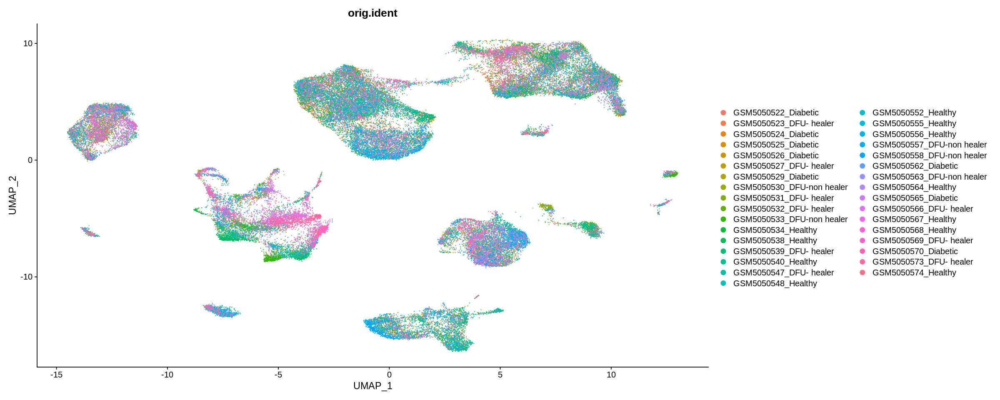

In [11]:
options(repr.plot.width = 20, repr.plot.height = 8)
DimPlot(DFU_Data.integrated, group.by = "orig.ident")

In [12]:
# Create a major_group column in the metadata
DFU_Data.integrated$major_group <- NA

# Assign major group labels based on patterns in orig.ident
DFU_Data.integrated$major_group[grep("_Diabetic$", DFU_Data.integrated$orig.ident)] <- "Diabetic"
DFU_Data.integrated$major_group[grep("_DFU- healer$", DFU_Data.integrated$orig.ident)] <- "DFU-Healer"
DFU_Data.integrated$major_group[grep("_Healthy$", DFU_Data.integrated$orig.ident)] <- "Healthy"
DFU_Data.integrated$major_group[grep("_DFU-non healer$", DFU_Data.integrated$orig.ident)] <- "DFU-Non Healer"
DFU_Data.integrated$major_group[is.na(DFU_Data.integrated$major_group)] <- "Other"

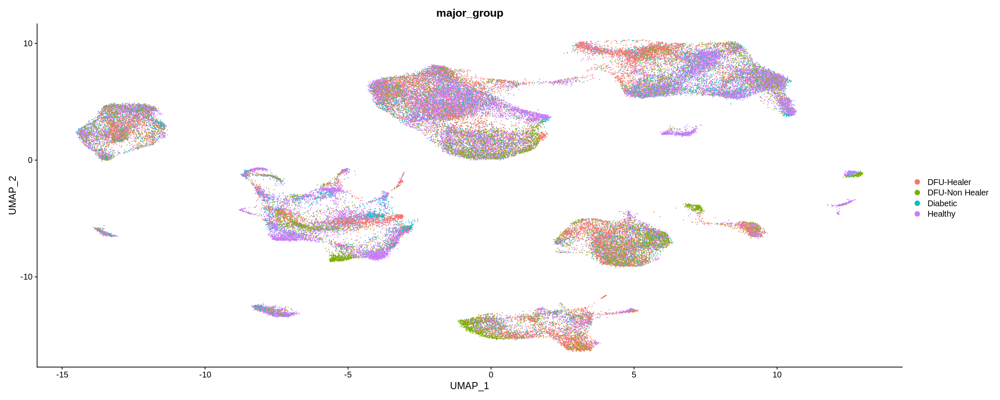

In [13]:
# Now, plot UMAP based on major groups
DimPlot(DFU_Data.integrated, group.by = "major_group")

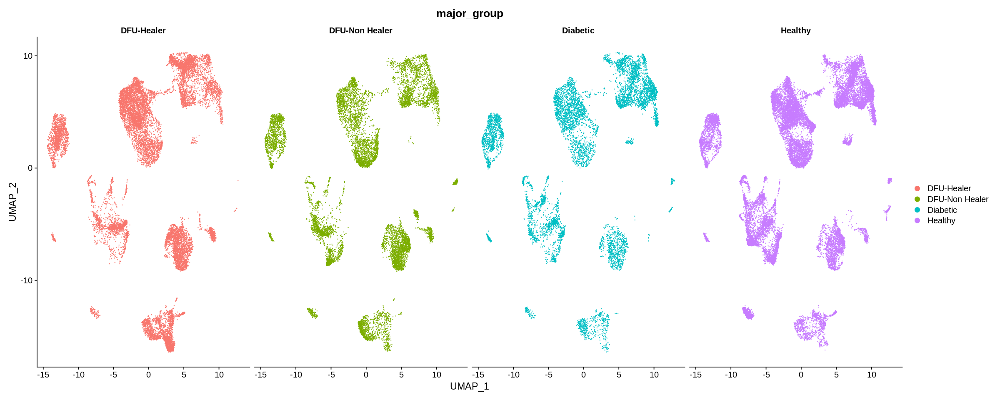

In [14]:
# Set the size of the UMAP plots
options(repr.plot.width = 20, repr.plot.height = 8)
# Create separate UMAP plots for each major group
DimPlot(DFU_Data.integrated, group.by = "major_group", split.by = "major_group")

In [15]:
DFU_Data.integrated <- FindNeighbors(DFU_Data.integrated, dims = 1:50)


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 63190
Number of edges: 2624901

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9669
Number of communities: 18
Elapsed time: 16 seconds


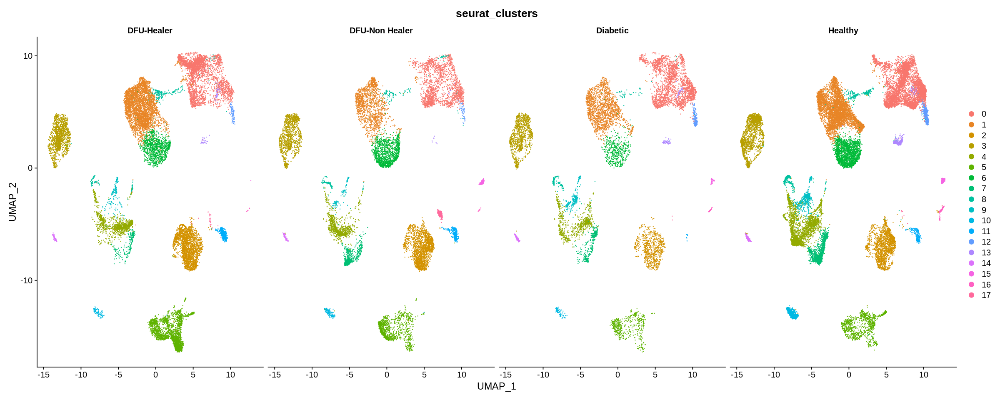

In [16]:
options(repr.plot.width = 20, repr.plot.height = 8)
DFU_Data.integrated <- FindClusters(DFU_Data.integrated, resolution = 0.2)  # can adjust the resolution parameter
DimPlot(DFU_Data.integrated, group.by = 'seurat_clusters', split.by = "major_group")

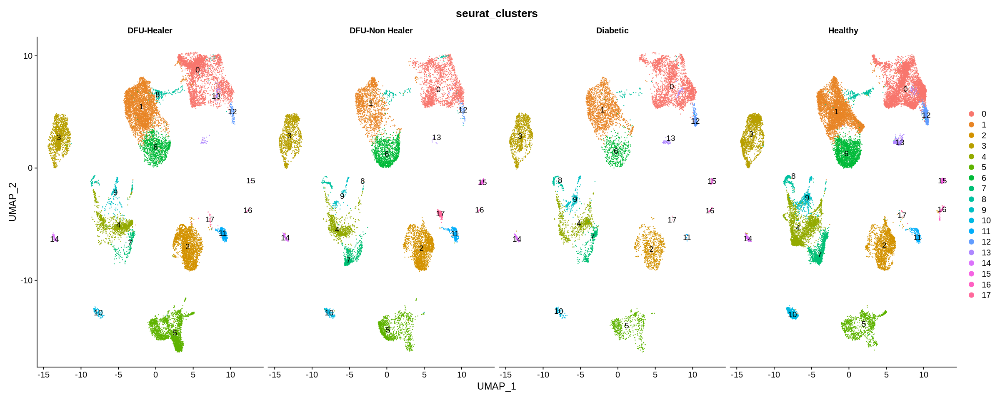

In [17]:
DimPlot(DFU_Data.integrated, 
        group.by = 'seurat_clusters', 
        split.by = "major_group", 
        label = TRUE) # Add labels to clusters


#Find markers

In [18]:
all.markers <- FindAllMarkers(object = DFU_Data.integrated)


Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17



In [19]:
head(x = all.markers)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
COMP,0,4.092530,0.955,0.795,0,0,COMP
COL1A1,0,4.070953,1.000,0.986,0,0,COL1A1
MMP2,0,3.854643,0.993,0.759,0,0,MMP2
COL3A1,0,3.694259,1.000,0.973,0,0,COL3A1
COL1A2,0,3.690801,1.000,0.983,0,0,COL1A2
CFD,0,3.200877,0.922,0.529,0,0,CFD


In [20]:
all.markers 

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
COMP,0,4.092530,0.955,0.795,0,0,COMP
COL1A1,0,4.070953,1.000,0.986,0,0,COL1A1
MMP2,0,3.854643,0.993,0.759,0,0,MMP2
COL3A1,0,3.694259,1.000,0.973,0,0,COL3A1
COL1A2,0,3.690801,1.000,0.983,0,0,COL1A2
CFD,0,3.200877,0.922,0.529,0,0,CFD
COL6A3,0,3.172033,0.993,0.717,0,0,COL6A3
DCN,0,3.127249,0.994,0.708,0,0,DCN
PTGDS,0,3.126295,0.939,0.434,0,0,PTGDS


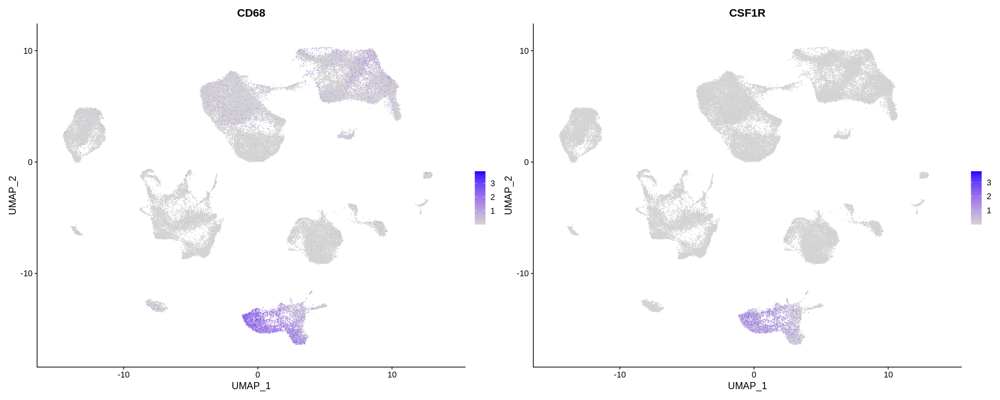

In [21]:
FeaturePlot(DFU_Data.integrated, features = c('CD68', 'CSF1R'), min.cutoff = "q9") #min.cutoff = "q9",effectively visualizing the top 10% of expression values

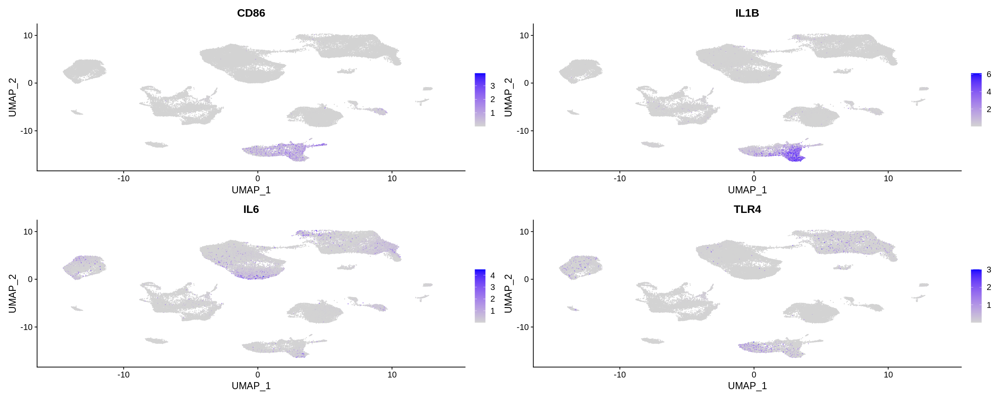

In [22]:
FeaturePlot(DFU_Data.integrated, features = c('CD86', 'IL1B', 'IL6','TLR4'), min.cutoff = "q9")

Warning message:
“Could not find CD79A in the default search locations, found in RNA assay instead”
Warning message:
“Could not find MS4A1 in the default search locations, found in RNA assay instead”


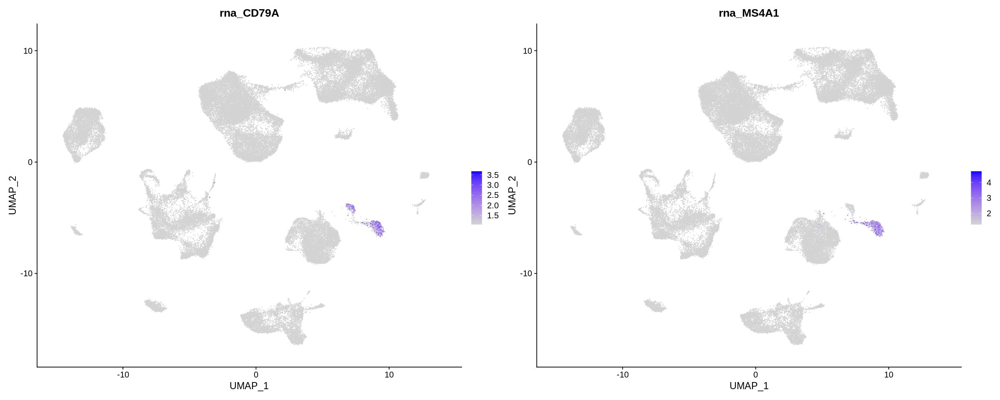

In [23]:
FeaturePlot(DFU_Data.integrated, features = c('CD79A', 'MS4A1'), min.cutoff = "q9") #b cell

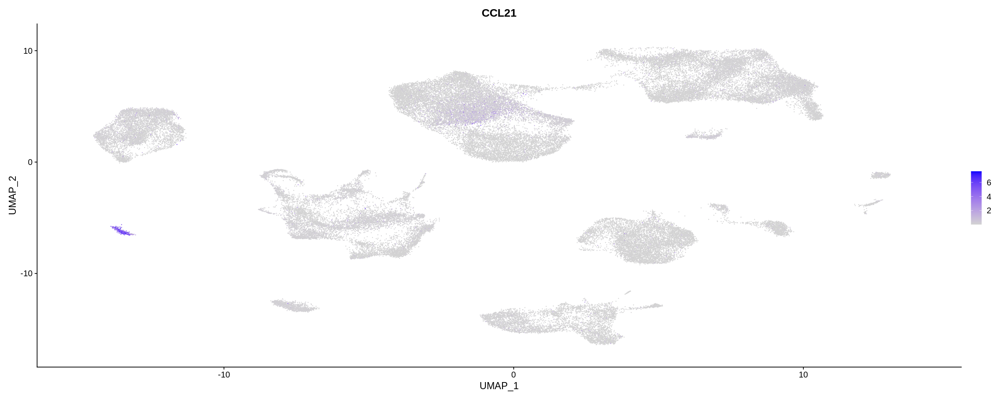

In [24]:
FeaturePlot(DFU_Data.integrated, features = c('CCL21'),min.cutoff = "q9") #LymphEndo

Warning message:
“Could not find MZB1 in the default search locations, found in RNA assay instead”


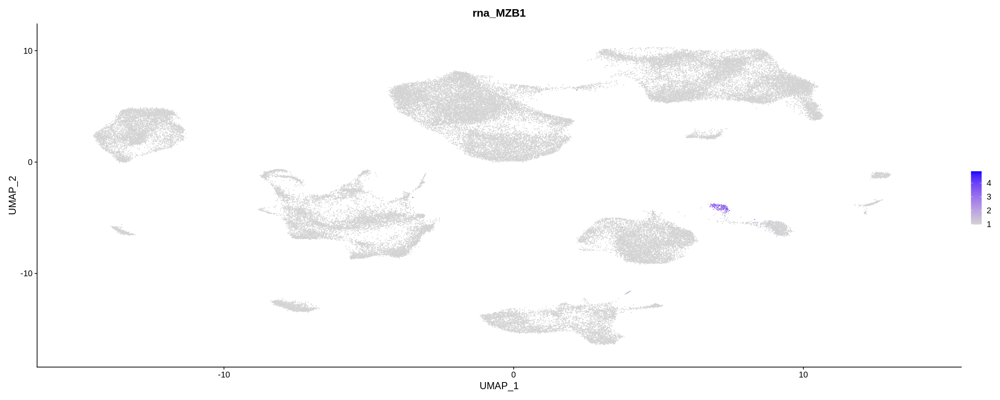

In [25]:
FeaturePlot(DFU_Data.integrated, features = c('MZB1'),min.cutoff = "q9") 

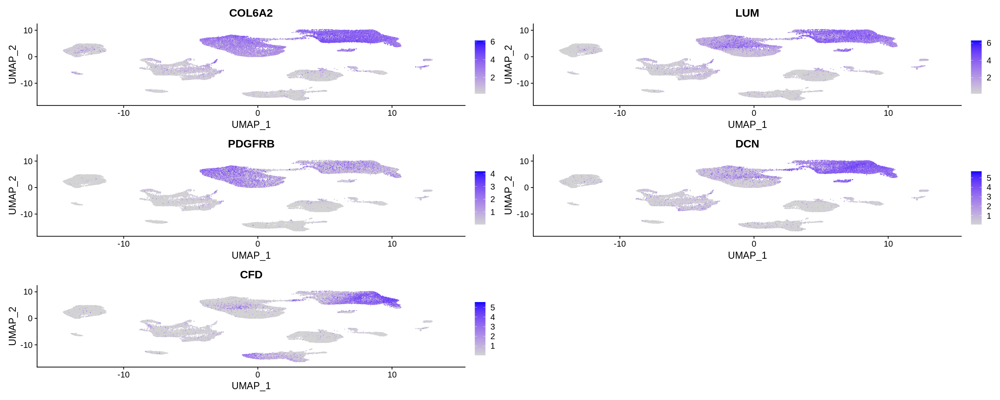

In [26]:
FeaturePlot(DFU_Data.integrated, features = c('COL6A2', 'LUM','PDGFRB','DCN','CFD'), min.cutoff = "q9") #Fibroblast

Warning message:
“Could not find FOXD2 in the default search locations, found in RNA assay instead”
Warning message:
“Could not find VIT in the default search locations, found in RNA assay instead”


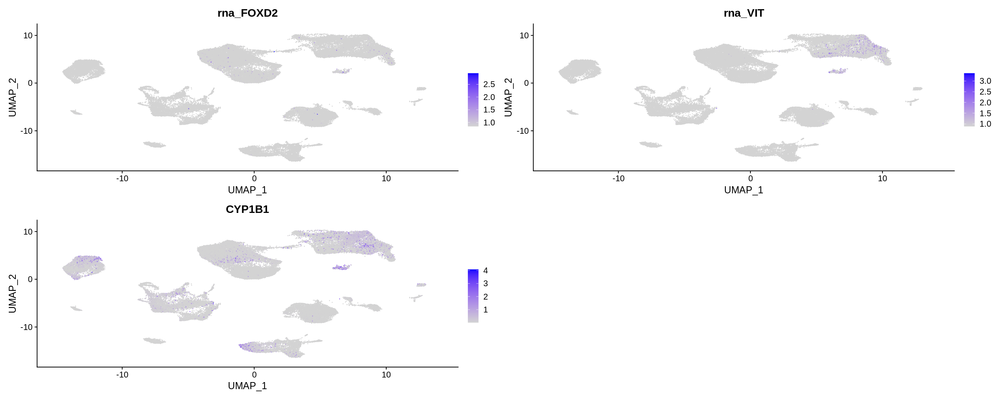

In [27]:
FeaturePlot(DFU_Data.integrated, features = c('FOXD2', 'VIT','CYP1B1'), min.cutoff = "q9") #Fibroblast

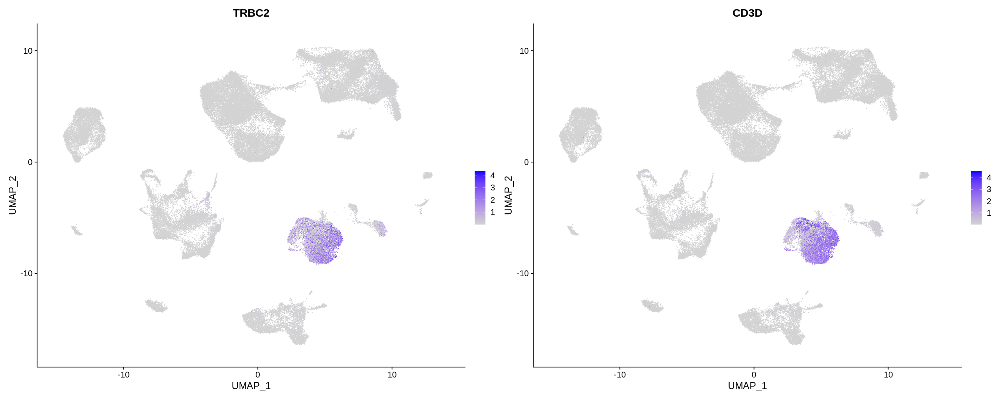

In [28]:
FeaturePlot(DFU_Data.integrated, features = c('TRBC2', 'CD3D'), min.cutoff = "q9") #Tcell

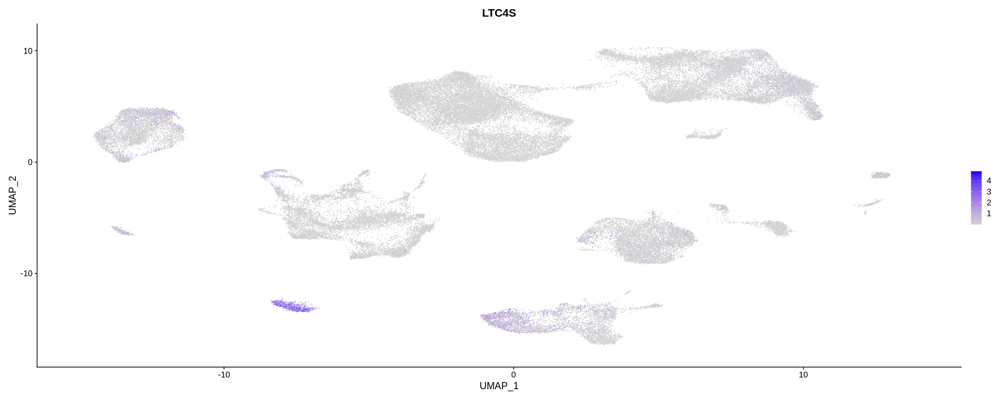

In [29]:
FeaturePlot(DFU_Data.integrated, features = c('LTC4S'), min.cutoff = "q9") #Mast cell

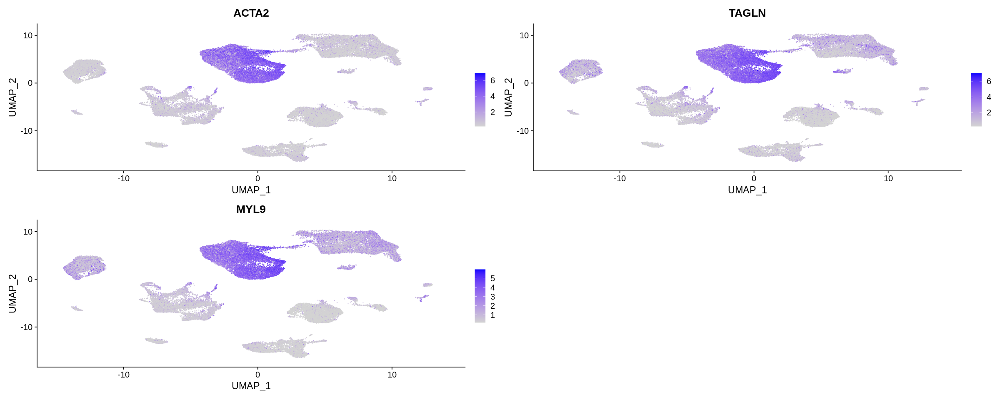

In [30]:
FeaturePlot(DFU_Data.integrated, features = c('ACTA2','TAGLN','MYL9'), min.cutoff = "q9") #SMC

Warning message:
“Could not find S100A14 in the default search locations, found in RNA assay instead”
Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: IVT”


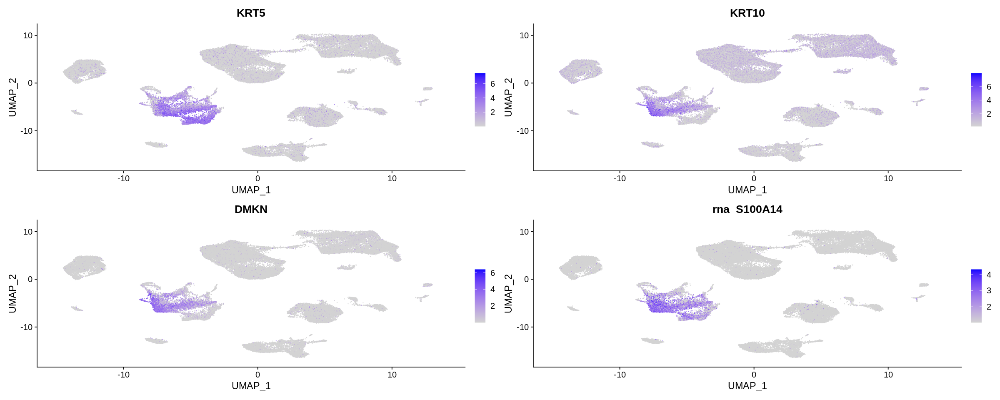

In [31]:
FeaturePlot(DFU_Data.integrated, features = c('KRT5', 'KRT10','IVT','DMKN','S100A14'), min.cutoff = "q9") #Keratinocyte

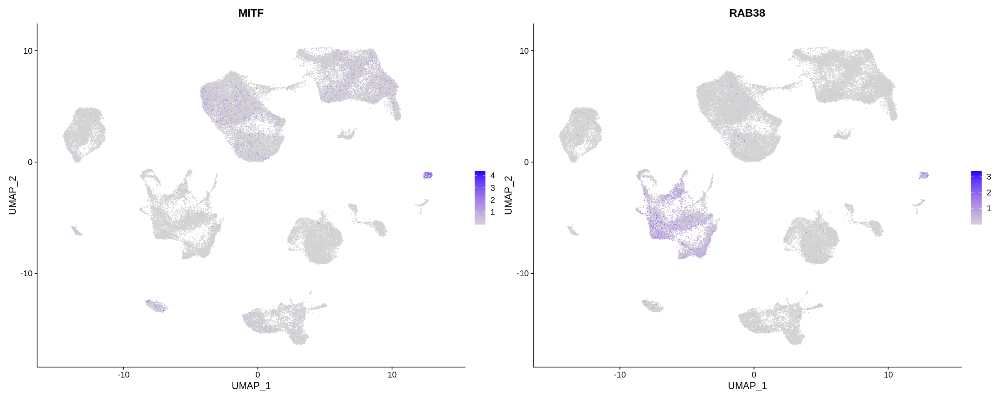

In [32]:
FeaturePlot(DFU_Data.integrated, features = c('MITF','RAB38'), min.cutoff = "q9") #Melanocytes

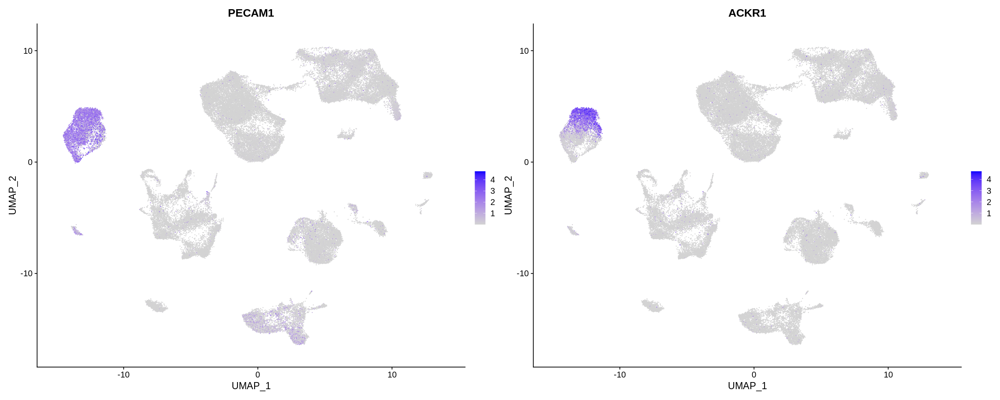

In [33]:
FeaturePlot(DFU_Data.integrated, features = c('PECAM1', 'ACKR1'), min.cutoff = "q9")

Warning message:
“Could not find VIT in the default search locations, found in RNA assay instead”
Warning message:
“Could not find FOXD2 in the default search locations, found in RNA assay instead”


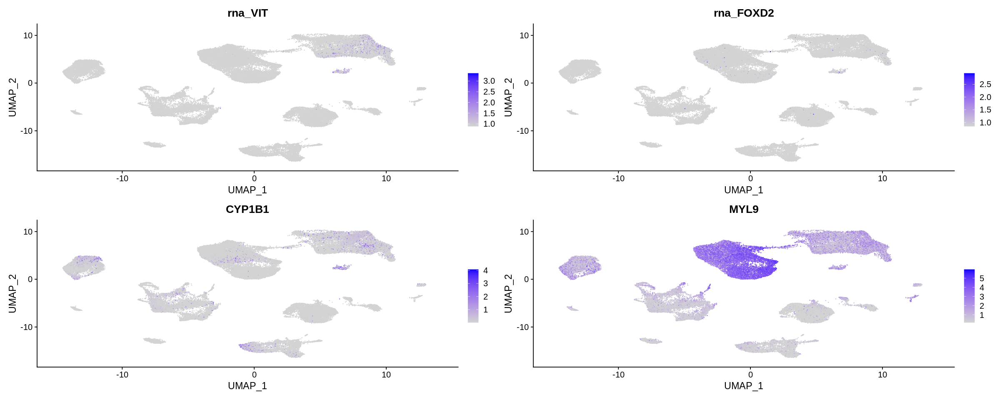

In [34]:
FeaturePlot(DFU_Data.integrated, features = c('VIT','FOXD2', 'CYP1B1','MYL9'), min.cutoff = "q9") #fibroblast

In [36]:
markers

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
KRT5,0,3.2024592,0.989,0.591,0
APOE,0,-2.1888727,0.351,0.697,0
CXCL14,0,3.0900812,0.984,0.748,0
S100A9,0,0.6638397,0.938,0.841,0
HSPA6,0,0.6331430,0.977,0.804,0
KRT16,0,0.9138816,0.974,0.887,0
HLA-DQB1,0,-1.2579945,0.879,0.415,0
S100A2,0,3.7049854,0.983,0.823,0
GPR183,0,-1.5642992,0.965,0.512,0


In [38]:
markers16 <- FindMarkers(DFU_Data.integrated, ident.1 = 16)
markers16

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GPM6B,2.559100e-216,3.8430891,0.987,0.788,5.118200e-213
PMP22,2.266326e-193,3.6040595,0.990,0.887,4.532651e-190
CD9,1.739002e-191,2.4492263,0.997,0.887,3.478004e-188
CRYAB,1.791940e-171,3.1732847,0.967,0.813,3.583879e-168
S100A6,1.970324e-139,1.5651297,1.000,0.989,3.940649e-136
FHL5,2.626842e-131,-0.3652770,0.058,0.329,5.253684e-128
SPARC,6.021750e-129,1.8921330,1.000,0.983,1.204350e-125
VIM,2.362376e-127,1.3991897,1.000,0.968,4.724753e-124
IGFBP6,2.783002e-124,-1.0870546,0.107,0.528,5.566005e-121


In [39]:
markers13 <- FindMarkers(DFU_Data.integrated, ident.1 = 13)
markers13

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
VWF,0.000000e+00,-0.6709424,0.020,0.513,0.000000e+00
RDH10,5.314792e-307,0.7638875,0.952,0.410,1.062958e-303
APOD,2.847151e-306,5.5059736,0.936,0.360,5.694302e-303
CPXM2,2.312908e-281,0.6118805,0.975,0.469,4.625816e-278
HEY1,3.321914e-279,0.2977691,0.952,0.597,6.643827e-276
PTGDS,6.992328e-276,3.6432085,0.974,0.533,1.398466e-272
MIA,8.793899e-273,0.3237434,0.893,0.205,1.758780e-269
AGT,5.464747e-250,0.6814439,0.951,0.792,1.092949e-246
PODNL1,2.706573e-249,0.8272100,0.985,0.617,5.413146e-246


In [48]:
DFU_Data.integrated_celltype <- RenameIdents(DFU_Data.integrated, 
  `0` = "Fibroblast", `1` = "SMC", `2` = "Tcell",
  `3` = "Epithelialcell", `4` = "Keratinocyte",
  `5` = "Macrophage", `6` = "SMC", `7` = "Keratinocyte", 
  `8` = "Keratinocyte", `9` = "Keratinocyte",
  `10` = "Mastcell", `11` = "Bcell", `12` = "Fibroblast", 
  `13` = "Fibroblast", `14` = "Lymphoendo", 
  `15` = "Melanocytes", `16` = "Unknown", `17` = "Plasma")

DimPlot(DFU_Data.integrated_celltype, label = TRUE)


ERROR: Error in RenameIdents.Seurat(DFU_Data.integrated, `0` = "Fibroblast", : Cannot find any of the provided identities


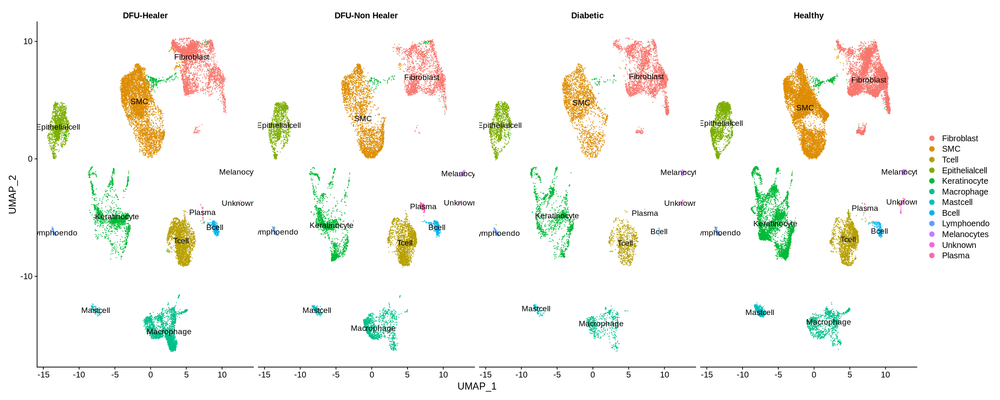

In [49]:
DimPlot(DFU_Data.integrated, 
               split.by = "major_group", 
        label = TRUE) # Add labels to clusters

In [44]:
DFU_Data.integrated

An object of class Seurat 
26850 features across 63190 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [50]:
head(DFU_Data.integrated)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,major_group,integrated_snn_res.0.2,seurat_clusters
,<chr>,<dbl>,<int>,<dbl>,<chr>,<fct>,<fct>
AAACCTGCATGTAAGA_1,GSM5050522_Diabetic,2493,1109,5.535499,Diabetic,6,6
AAACCTGGTGTGACGA_1,GSM5050522_Diabetic,1487,832,3.496974,Diabetic,3,3
AAACGGGTCTTGTTTG_1,GSM5050522_Diabetic,3134,1501,1.882578,Diabetic,3,3
AAAGATGGTCAGAGGT_1,GSM5050522_Diabetic,2467,1078,1.216052,Diabetic,0,0
AAAGATGGTCCAAGTT_1,GSM5050522_Diabetic,3816,1648,1.441300,Diabetic,0,0
AAAGCAAAGCGTTTAC_1,GSM5050522_Diabetic,3871,1635,2.195815,Diabetic,0,0
AAAGCAAAGTAGTGCG_1,GSM5050522_Diabetic,3655,1653,1.176471,Diabetic,0,0
AAAGCAAGTCGATTGT_1,GSM5050522_Diabetic,1740,949,1.091954,Diabetic,0,0
AAAGCAATCCTATGTT_1,GSM5050522_Diabetic,1254,696,1.196172,Diabetic,0,0


In [53]:
fibroblast_data <- DFU_Data.integrated[DFU_Data.integrated_celltype = "Fibroblast", ]


In [54]:
head(fibroblast_data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,major_group,integrated_snn_res.0.2,seurat_clusters
,<chr>,<dbl>,<int>,<dbl>,<chr>,<fct>,<fct>
AAACCTGCATGTAAGA_1,GSM5050522_Diabetic,2493,1109,5.535499,Diabetic,6,6
AAACCTGGTGTGACGA_1,GSM5050522_Diabetic,1487,832,3.496974,Diabetic,3,3
AAACGGGTCTTGTTTG_1,GSM5050522_Diabetic,3134,1501,1.882578,Diabetic,3,3
AAAGATGGTCAGAGGT_1,GSM5050522_Diabetic,2467,1078,1.216052,Diabetic,0,0
AAAGATGGTCCAAGTT_1,GSM5050522_Diabetic,3816,1648,1.441300,Diabetic,0,0
AAAGCAAAGCGTTTAC_1,GSM5050522_Diabetic,3871,1635,2.195815,Diabetic,0,0
AAAGCAAAGTAGTGCG_1,GSM5050522_Diabetic,3655,1653,1.176471,Diabetic,0,0
AAAGCAAGTCGATTGT_1,GSM5050522_Diabetic,1740,949,1.091954,Diabetic,0,0
AAAGCAATCCTATGTT_1,GSM5050522_Diabetic,1254,696,1.196172,Diabetic,0,0


In [55]:
fibroblast_data

An object of class Seurat 
26850 features across 63190 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [ ]:
fibroblast.de.markers <- FindMarkers(
  fibroblast_data,
 ident.1 = "DFU-healer",
 ident.2 = "DFU-Non healer"
)
